<a href="https://colab.research.google.com/github/chad-fisher/CRWA-Regional-Tree-Planting-and-Protection-Plan/blob/main/CodeNotebookInvasivesOnly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment setup

In [1]:
#Need this because on a different computer :(
!pip install matplotlib_scalebar
!pip install contextily
!pip install wget
!pip install pyinaturalist
!pip install geetools

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
#Import packages
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as cx
import ee
import geemap
import geemap.foliumap as geemapf
import rasterio as rio
from rasterio.plot import show
from rasterio.mask import mask
import wget
import zipfile
from datetime import datetime
import pyinaturalist
from scipy import ndimage
import urllib
import geetools
from geetools import batch

In [4]:
#Authenticate to Earth Engine
ee.Authenticate()

<IPython.core.display.HTML object>

In [5]:
#Initialize earth engine project
ee.Initialize(project='ee-cefisher20')

<IPython.core.display.HTML object>

In [ ]:
!cd "C:\Users\Chad\Desktop\CRWA Project\CRWA-Regional-Tree-Planting-and-Protection-Plan"

<IPython.core.display.HTML object>

# Extracting watershed boundaries

In [6]:
#HUC codes from https://apps.nationalmap.gov/viewer/
Charles=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000107' or huc10 == '0109000106'")
Charles_lower=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000107'")
Charles_upper=ee.FeatureCollection("USGS/WBD/2017/HUC10").filter("huc10 == '0109000106'")

<IPython.core.display.HTML object>

In [7]:
#Convert earth engine feature collections to geopandas data frames
Charles_gdf = ee.data.computeFeatures({
    'expression': Charles,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_gdf.crs = 'EPSG:4326'

Charles_lower_gdf = ee.data.computeFeatures({
    'expression': Charles_lower,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_lower_gdf.crs = 'EPSG:4326'

Charles_upper_gdf = ee.data.computeFeatures({
    'expression': Charles_upper,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
Charles_upper_gdf.crs = 'EPSG:4326'

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

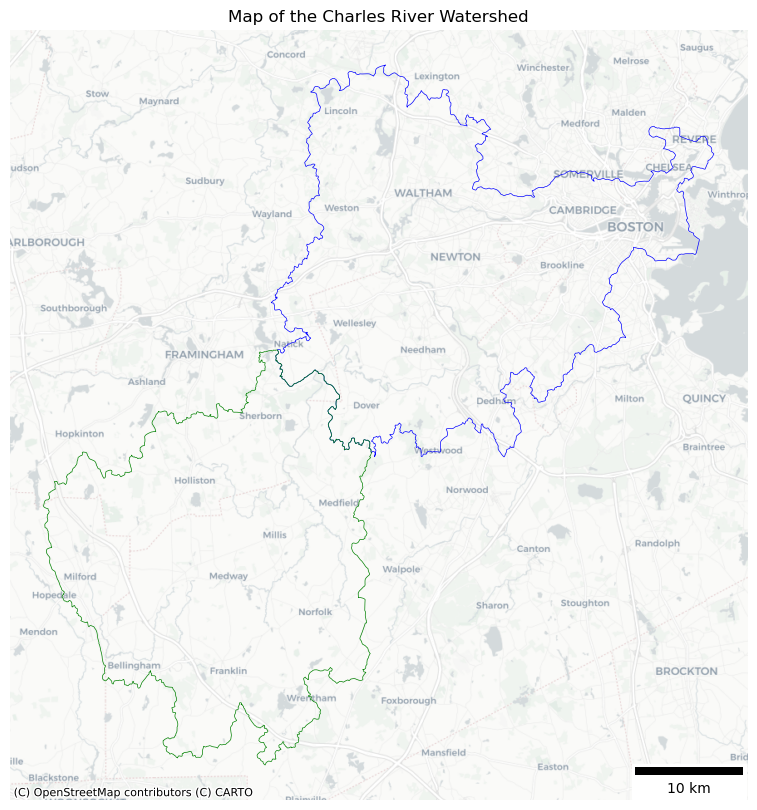

In [ ]:
ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
plt.title("Map of the Charles River Watershed")
cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
ax.set_axis_off()
ax.add_artist(ScaleBar(1,location='lower right'))
plt.savefig("Charles Watershed Maps.png")

In [8]:
#Create function to clip image to be used for clipping image collections
def Charclip(image):
    return image.clip(Charles)

<IPython.core.display.HTML object>

# Land Cover Maps

In [25]:
#Forest Areas
NLCD2019lc=ee.Image('USGS/NLCD_RELEASES/2019_REL/NLCD/2019').clip(Charles).select('landcover')
map_1 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(41)),name='Deciduous Forest',color='light green')
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(42)),name='Evergreen Forest',color='dark green')
map_1.add_layer(NLCD2019lc.updateMask(NLCD2019lc.eq(43)),name='Mixed Forest',color='green')
map_1.add_legend()
map_1

#NLCD change maps for forest types, check out different times
#Add boundary to map

<IPython.core.display.HTML object>

<geemap.foliumap.Map object at 0x7e225848f6d0>

In [26]:
d_forest=NLCD2019lc.updateMask(NLCD2019lc.eq(41)).select('landcover')
d_forest_vec=d_forest.reduceToVectors(geometry=Charles,crs=d_forest.projection())

d_forest_gdf = ee.data.computeFeatures({
    'expression': d_forest_vec,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
d_forest_gdf.crs = 'EPSG:4326'

e_forest=NLCD2019lc.updateMask(NLCD2019lc.eq(42)).select('landcover')
e_forest_vec=e_forest.reduceToVectors(geometry=Charles,crs=e_forest.projection())

e_forest_gdf = ee.data.computeFeatures({
    'expression': e_forest_vec,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
e_forest_gdf.crs = 'EPSG:4326'

m_forest=NLCD2019lc.updateMask(NLCD2019lc.eq(43)).select('landcover')
m_forest_vec=m_forest.reduceToVectors(geometry=Charles,crs=m_forest.projection())

m_forest_gdf = ee.data.computeFeatures({
    'expression': m_forest_vec,
    'fileFormat': 'GEOPANDAS_GEODATAFRAME'
})
m_forest_gdf.crs = 'EPSG:4326'

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

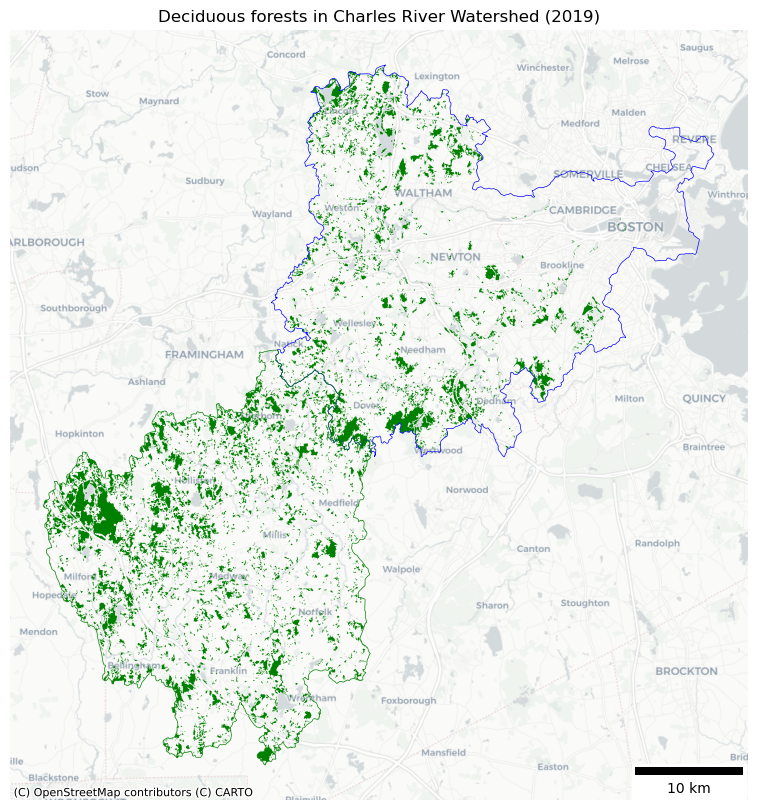

In [ ]:
ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
d_forest_gdf.to_crs(epsg=3857).plot(ax=ax,color='green')
#e_forest_gdf.to_crs(epsg=3857).plot(ax=ax,color='brown')
#m_forest_gdf.to_crs(epsg=3857).plot(ax=ax,color='black')
plt.title("Deciduous forests in Charles River Watershed (2019)")
cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
ax.set_axis_off()
ax.add_artist(ScaleBar(1,location='lower right'))
plt.savefig("Deciduous forests in Charles River Watershed (2019).png")

# Invasive Species Data Collection

In [27]:
#Extract Sentinel 2 bands and indices of interest
def extractBandsIndices(image):
    return image.select(['B2','B3','B4','B5_10m','B6_10m','B7_10m','B8','B8A_10m','B11_10m','B12_10m',
                         'NDVI','NBR','SAVI','RENDVI','EVI'])

<IPython.core.display.HTML object>

In [28]:
#Resample Sentinel 2 bands to 10 m
def resample10m(image):
    proj_10m=image.select('B4').projection()
    B5_res=image.select('B5').resample('bicubic').reproject(proj_10m).rename('B5_10m')
    B6_res=image.select('B6').resample('bicubic').reproject(proj_10m).rename('B6_10m')
    B7_res=image.select('B7').resample('bicubic').reproject(proj_10m).rename('B7_10m')
    B8A_res=image.select('B8A').resample('bicubic').reproject(proj_10m).rename('B8A_10m')
    B11_res=image.select('B11').resample('bicubic').reproject(proj_10m).rename('B11_10m')
    B12_res=image.select('B12').resample('bicubic').reproject(proj_10m).rename('B12_10m')
    return image.addBands([B5_res,B6_res,B7_res,B8A_res,B11_res,B12_res])

<IPython.core.display.HTML object>

In [29]:
#Add 5 vegetation indices of interest
def addIndices(image):
    NDVI = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    NBR = image.normalizedDifference(['B12_10m','B8']).rename('NBR')
    SAVI = image.expression(
        '1.5 * ((NIR - RED)) / (NIR + RED + 0.5)', {
            'NIR' : image.select('B8'),
            'RED' : image.select('B4'),
        }).rename('SAVI')
    RENDVI = image.normalizedDifference(['B6_10m','B5_10m']).rename('RENDVI')
    EVI = image.expression(
        '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))', {
            'NIR' : image.select('B8'),
            'RED' : image.select('B4'),
            'BLUE': image.select('B2')}).rename('EVI')
    return image.addBands([NDVI,NBR,SAVI,RENDVI,EVI])

<IPython.core.display.HTML object>

In [30]:
#Cloud mask function
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = (
        qa.bitwiseAnd(cloud_bit_mask)
        .eq(0)
        .And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    )
    return image.updateMask(mask).divide(10000)

<IPython.core.display.HTML object>

In [31]:
#Land cover mask function
def mask_forests(image):
    mask=(NLCD2019lc.eq(41))
    return image.updateMask(mask)

<IPython.core.display.HTML object>

In [17]:
Soils = gpd.read_file("/content/SoilsCRW.shp").to_crs(epsg=32618)

<IPython.core.display.HTML object>

In [36]:
def preprocess(img):
  return extractBandsIndices(addIndices(resample10m(Charclip(img))))

<IPython.core.display.HTML object>

In [37]:
#Pre-processing sentinel-2 data
S2_All=ee.ImageCollection(("COPERNICUS/S2_SR_HARMONIZED")).filterDate('2019-01-01','2020-01-01').filterBounds(Charles.geometry()).filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50)).map(preprocess)

<IPython.core.display.HTML object>

In [38]:
S2_raw=ee.ImageCollection(("COPERNICUS/S2_SR_HARMONIZED")).filterDate('2019-01-01','2020-01-01').filterBounds(Charles.geometry()).filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50))

<IPython.core.display.HTML object>

In [40]:
def dateFormat(img):
  return ee.Image(img).date().format().split('T').get(0)

<IPython.core.display.HTML object>

In [41]:
dates_list=ee.List(S2_raw.toList(S2_raw.size()).map(dateFormat)).distinct()

<IPython.core.display.HTML object>

In [42]:
def mosaicBy(d):
  return ee.ImageCollection(("COPERNICUS/S2_SR_HARMONIZED")).filterBounds(Charles.geometry()).filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 50)).filterDate(d,ee.Date(d).advance(1,'day')).mosaic()

<IPython.core.display.HTML object>

In [72]:
S2_fix=ee.ImageCollection(dates_list.map(mosaicBy)).map(mask_s2_clouds).map(preprocess)
S2_for_export=S2_fix.map(mask_forests).select('NDVI')

<IPython.core.display.HTML object>

In [45]:
#Getting Boston city boundary
towns=gpd.read_file('/content/CENSUS2020TOWNS_POLY.shp').to_crs(epsg=4326).dissolve('NAMELSAD20')
Boston_gdf=towns[towns.index=='Boston city']
Boston=geemap.geopandas_to_ee(Boston_gdf)

<IPython.core.display.HTML object>

In [46]:
d_forest=NLCD2019lc.updateMask(NLCD2019lc.eq(41)).select('landcover').clip(Boston)
d_forest_vec=d_forest.reduceToVectors(geometry=Charles,crs=d_forest.projection())

<IPython.core.display.HTML object>

In [47]:
forest_list=d_forest_vec.toList(10000)

<IPython.core.display.HTML object>

In [60]:
forest_list

<IPython.core.display.HTML object>

<ee.ee_list.List object at 0x7e225536e8c0>

In [64]:
map_1 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_1.add_layer(ee.Feature(forest_list.get(0)))
map_1

<IPython.core.display.HTML object>

<geemap.foliumap.Map object at 0x7e22547ec8e0>

In [48]:
forest_list.size()

<IPython.core.display.HTML object>

<ee.ee_number.Number object at 0x7e225536edd0>

In [61]:
ee.Feature(forest_list.get(1))

<IPython.core.display.HTML object>

<ee.feature.Feature object at 0x7e225536fa60>

In [75]:
pd.DataFrame(data=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[1:],columns=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[0])

<IPython.core.display.HTML object>

,id,longitude,latitude,time,NDVI
0,0,-71.167367,42.346088,None,0.418364
1,1,-71.167367,42.346088,None,0.429053
2,2,-71.167367,42.346088,None,0.354041
3,3,-71.167367,42.346088,None,0.402667
4,4,-71.167367,42.346088,None,NaN
...,...,...,...,...,...
1035,75,-71.167007,42.346268,None,0.506297
1036,76,-71.167007,42.346268,None,0.360434
1037,77,-71.167007,42.346268,None,0.439830
1038,78,-71.167007,42.346268,None,0.049919


In [77]:
pd.concat([pd.DataFrame(data=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[1:],columns=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[0]),pd.DataFrame(data=S2_for_export.getRegion(ee.Feature(forest_list.get(1)).geometry(),10).getInfo()[1:],columns=S2_for_export.getRegion(ee.Feature(forest_list.get(1)).geometry(),10).getInfo()[0])])

<IPython.core.display.HTML object>

,id,longitude,latitude,time,NDVI
0,0,-71.167367,42.346088,None,0.418364
1,1,-71.167367,42.346088,None,0.429053
2,2,-71.167367,42.346088,None,0.354041
3,3,-71.167367,42.346088,None,0.402667
4,4,-71.167367,42.346088,None,NaN
...,...,...,...,...,...
5915,75,-71.167636,42.345280,None,0.675100
5916,76,-71.167636,42.345280,None,0.511152
5917,77,-71.167636,42.345280,None,0.561576
5918,78,-71.167636,42.345280,None,-0.010687


In [ ]:
my_list=ee.List.sequence(1,forest_list.size().subtract(1))
NDVI_Forest=pd.DataFrame(data=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[1:],columns=S2_for_export.getRegion(ee.Feature(forest_list.get(0)).geometry(),10).getInfo()[0])
j=0
for i in my_list.getInfo():
  j+=1
  print(j)
  print(NDVI_Forest.size)
  x = my_list.get(i)
  NDVI_Forest=pd.concat([NDVI_Forest,pd.DataFrame(data=S2_for_export.getRegion(ee.Feature(forest_list.get(x)).geometry(),10).getInfo()[1:],columns=S2_for_export.getRegion(ee.Feature(forest_list.get(x)).geometry(),10).getInfo()[0])])

<IPython.core.display.HTML object>

1
5200
2
10000


In [ ]:
NDVI_copy=NDVI_Forest
NDVI_Copy.iloc[0,3]=int(0)

<IPython.core.display.HTML object>

In [ ]:
S2_forest['id']=pd.to_numeric(S2_forest['id'])

<IPython.core.display.HTML object>

In [ ]:
S2_forests=S2_forest.groupby('id').mean()

<IPython.core.display.HTML object>

In [ ]:
dates_df=pd.DataFrame({'date': np.asarray(dates_list.getInfo())})

<IPython.core.display.HTML object>

KeyboardInterrupt: 

In [ ]:
S2_forests=S2_forests.merge(dates_df,left_index=True,right_index=True)

<IPython.core.display.HTML object>

In [ ]:
date_format = "%Y-%m-%d"

<IPython.core.display.HTML object>

In [ ]:
for i in np.arange(0,S2_forests.index.size-1):
  time_str1=S2_forests.iloc[i+1,8]
  time_str2=S2_forests.iloc[0,8]
  S2_forests.iloc[i+1,2]=(datetime.strptime(time_str1,date_format)-datetime.strptime(time_str2,date_format)).days

<IPython.core.display.HTML object>

In [ ]:
S2_forests

<IPython.core.display.HTML object>

,longitude,latitude,time,NDVI,EVI,SAVI,RENDVI,NBR,date
id,,,,,,,,,
0,-71.547579,42.186841,0.0,0.516636,0.200402,0.218874,0.209969,-0.262466,2019-01-03
1,-71.547579,42.186841,10,0.500687,0.197119,0.218702,0.207729,-0.177492,2019-01-13
2,-71.547579,42.186841,12,NaN,NaN,NaN,NaN,NaN,2019-01-15
3,-71.547579,42.186841,22,NaN,NaN,NaN,NaN,NaN,2019-01-25
4,-71.547579,42.186841,25,0.403222,0.193366,0.194460,0.121187,-0.322172,2019-01-28
...,...,...,...,...,...,...,...,...,...
257,-71.547579,42.186841,1065,0.497081,0.258807,0.259676,0.272727,-0.772388,2021-12-03
258,-71.547579,42.186841,1067,NaN,NaN,NaN,NaN,NaN,2021-12-05
259,-71.547579,42.186841,1082,0.526119,0.218501,0.232297,0.212318,-0.225963,2021-12-20


In [74]:
NDVI_Forest.to_csv('NDVI.csv')

<IPython.core.display.HTML object>

In [ ]:
S2_Forest.index.size

In [ ]:
S2_forest=pd.DataFrame(data=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(0))).geometry(),10).getInfo()[1:],columns=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(0))).geometry(),10).getInfo()[0])

<IPython.core.display.HTML object>

In [ ]:
pd.concat([S2_forest,pd.DataFrame(data=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(1))).geometry(),10).getInfo()[1:],columns=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(1))).geometry(),10).getInfo()[0])])

<IPython.core.display.HTML object>

,id,longitude,latitude,time,B2,B3,B4,B5_10m,B6_10m,B7_10m,B8,B8A_10m,B11_10m,B12_10m,NDVI,NBR,SAVI,RENDVI,EVI
0,20190103T154641_20190103T155109_T18TYM,-71.549150,42.184931,1546530684000,187.0,267.0,374.0,635,993,1169,1324.0,1448,1454,844,0.559482,-0.221402,0.838976,0.219902,1.096238
1,20190103T154641_20190103T155109_T19TBG,-71.549150,42.184931,1546530684000,169.0,271.0,380.0,648,1080,1241,1601.0,1552,1420,820,0.616355,-0.322594,0.924300,0.250000,1.167527
2,20190113T154611_20190113T155046_T18TYM,-71.549150,42.184931,1547394685000,155.0,277.0,426.0,608,1052,1205,1533.0,1521,1493,942,0.565084,-0.238788,0.847410,0.267470,0.945346
3,20190113T154611_20190113T155046_T19TBG,-71.549150,42.184931,1547394685000,134.0,233.0,346.0,613,1131,1297,1930.0,1577,1451,901,0.695958,-0.363476,1.043707,0.297018,1.319121
4,20190115T153609_20190115T153706_T18TYM,-71.549150,42.184931,1547566892000,415.0,552.0,637.0,959,1464,1758,2230.0,2125,2012,1312,0.555633,-0.259176,0.833304,0.208419,1.354362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10038,20191129T154611_20191129T155035_T19TBG,-71.548791,42.184571,1575042689166,160.0,271.0,371.0,682,981,1149,1589.0,1471,1592,965,0.621429,-0.244323,0.931905,0.179796,1.163991
10039,20191219T154641_20191219T155110_T18TYM,-71.548791,42.184571,1576770683814,1593.0,1874.0,1848.0,2361,2530,2694,3120.0,2753,677,568,0.256039,-0.691974,0.384019,0.034553,1.406146
10040,20191219T154641_20191219T155110_T19TBG,-71.548791,42.184571,1576770683874,827.0,853.0,1020.0,1830,2031,2224,2361.0,2333,662,543,0.396628,-0.626033,0.594854,0.052059,1.470717
10041,20191224T154649_20191224T154843_T18TYM,-71.548791,42.184571,1577202684910,484.0,674.0,808.0,961,1333,1501,2050.0,1699,1202,852,0.434570,-0.412819,0.651740,0.162162,0.949832


In [ ]:
S2_forest=[]
for i in np.arange(0,4375):
  S2_forest=S2_forest.append(pd.DataFrame(data=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(i))).geometry(),10).getInfo()[1:],columns=S2_All.getRegion(ee.Feature(forest_list.get(ee.Number(i))).geometry(),10).getInfo()[0]))

<IPython.core.display.HTML object>

EEException: Invalid argument specified for ee.Number(): 0

In [ ]:
S2_forest=pd.DataFrame(data=S2_All.getRegion(ee.Feature(d_forest_vec.first()).geometry(),10).getInfo()[1:],columns=S2_All.getRegion(ee.Feature(d_forest_vec.first()).geometry(),10).getInfo()[0])

<IPython.core.display.HTML object>

In [ ]:
d_forest_vec.first()

<IPython.core.display.HTML object>

<ee.element.Element object at 0x7e6a773a5f00>

In [ ]:
#Map of first image in collection
map_3 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_3.add_layer(ee.Image(S2_for_export.first()), {'bands':['B4','B3','B2'],'min':0,'max':0.2})
map_3

<IPython.core.display.HTML object>

<geemap.foliumap.Map object at 0x7e6a80bddcf0>

In [ ]:
for i in

In [ ]:
S2=S2_fix.select(['B4','B3','B2'])
S2_list=S2.toList(S2.size())
videoArgs = {
  'dimensions': 290,
  'region': Charles.geometry(),
  'framesPerSecond': 1,
  'crs': 'EPSG:3857',
  'bands': ['B4','B3','B2'],
  'min': 0,
  'max': 0.2,
  'format':'gif'
}
urllib.request.urlretrieve(S2.getVideoThumbURL(videoArgs),'S22019_2020.gif')
geemap.add_text_to_gif('S22019_2020.gif','S22019_2020wLabels.gif',text_sequence=dates_list.getInfo(),font_color='white')

<IPython.core.display.HTML object>

In [ ]:
NDVI=S2_fix.select('NDVI')
NDVI_list=NDVI.toList(NDVI.size())
videoArgs = {
  'dimensions': 290,
  'region': Charles.geometry(),
  'framesPerSecond': 1,
  'crs': 'EPSG:3857',
  'min': 0,
  'max': 1,
  'format':'gif'
}
urllib.request.urlretrieve(NDVI.getVideoThumbURL(videoArgs),'NDVI2019_2020.gif')
geemap.add_text_to_gif('NDVI2019_2020.gif','NDVI2019_2020wLabels.gif',text_sequence=dates_list.getInfo(),font_color='white')

<IPython.core.display.HTML object>

In [30]:
#List of invasive species of interest
# Japanese knotweed, Asian bittersweet, glossy buckthorn, euonymous, multiflora rose, cork tree, kudzu, porcelain berry
# garlic mustard, bittersweet, glossy buckthron, multiflora rose, knotweed
# Canterbury Brook, Muddy river
# Research application
# https://www.massaudubon.org/nature-wildlife/invasive-plants-in-massachusetts
def get_obs(years,taxon_id):
  response=pyinaturalist.v1.observations.get_observations(year=years,taxon_id=taxon_id,geo=True,page='all',place_id=2)
  my_observations = pyinaturalist.Observation.from_json_list(response)
  df = pd.DataFrame(
      [
          {
              'latitude': o.location[0],
              'longitude': o.location[1],
              'date': o.observed_on.isoformat()
          }
          for o in my_observations
          if o.location
      ]
  )
  gdf = gpd.GeoDataFrame(
      df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
  )
  return gdf

<IPython.core.display.HTML object>

In [31]:
# https://nbviewer.org/gist/perrygeo/c426355e40037c452434
def density_heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.gaussian_filter(logheatmap, smoothing, mode='nearest')

    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

<IPython.core.display.HTML object>

In [33]:

years=[2018,2019,2020,2021,2022]
knotweed=914922
bittersweet=64540
buckthorn=55972
euonymus=117433
multiflora=78882
corktree=166636
porcelain=204237
kudzu=62671
barberry=58727

knot_gdf=get_obs(years,knotweed)
bitt_gdf=get_obs(years,bittersweet)
buck_gdf=get_obs(years,buckthorn)
euon_gdf=get_obs(years,euonymus)
mult_gdf=get_obs(years,multiflora)
cork_gdf=get_obs(years,corktree)
porc_gdf=get_obs(years,porcelain)
kudz_gdf=get_obs(years,kudzu)
barb_gdf=get_obs(years,barberry)

<IPython.core.display.HTML object>

<IPython.core.display.HTML object>

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:695: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


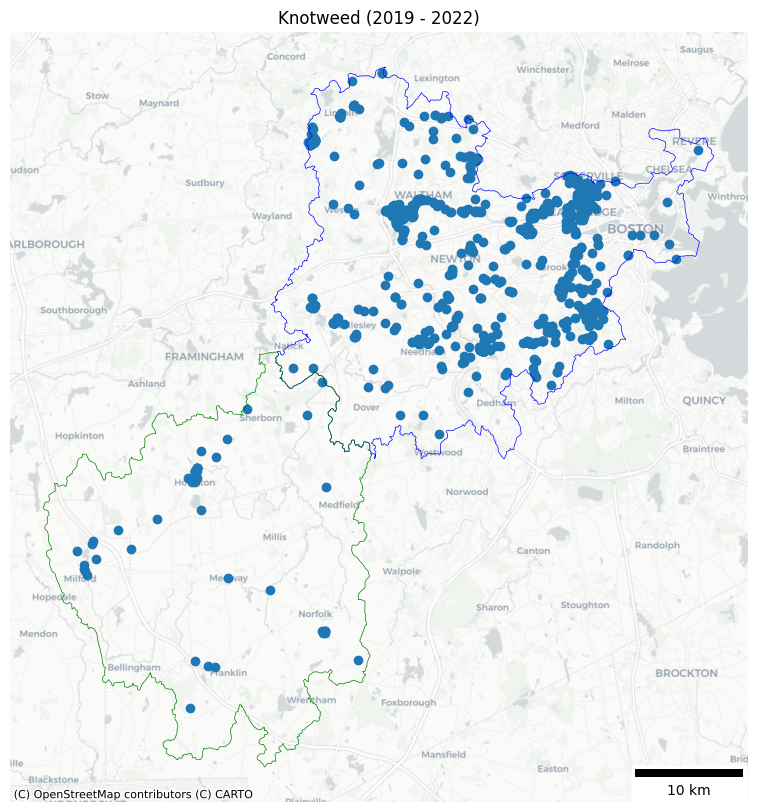

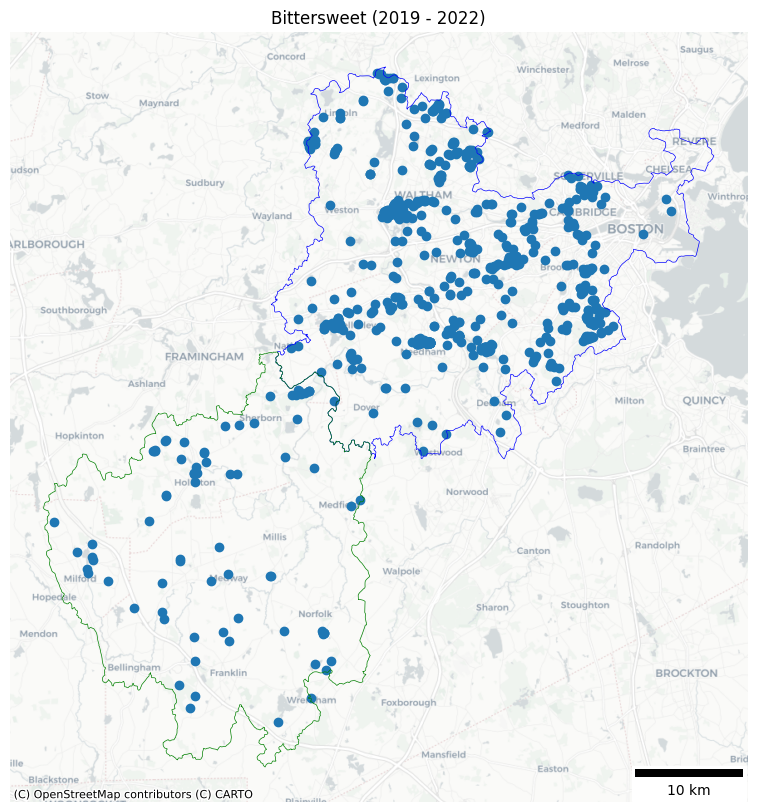

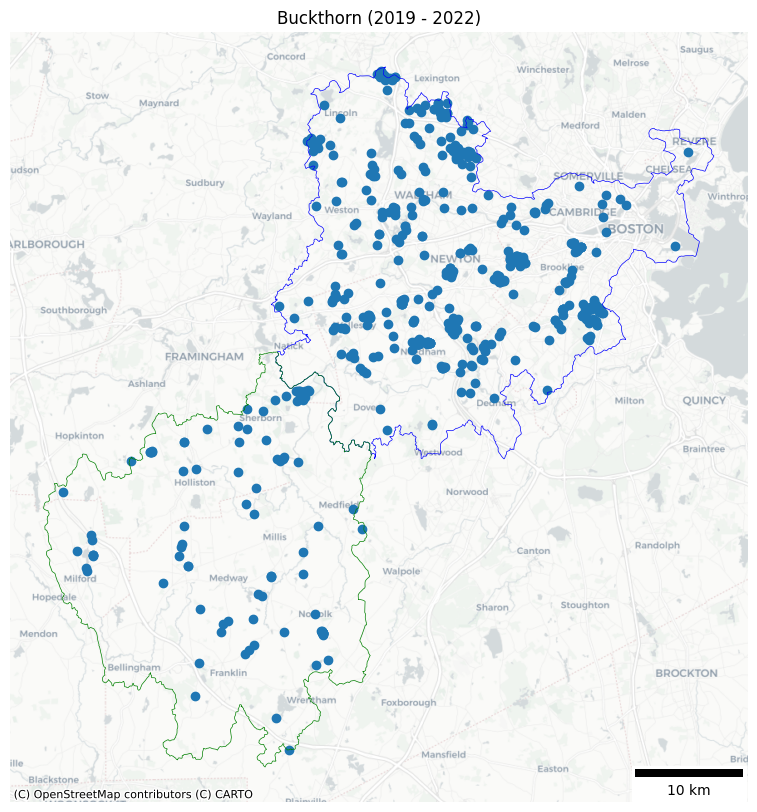

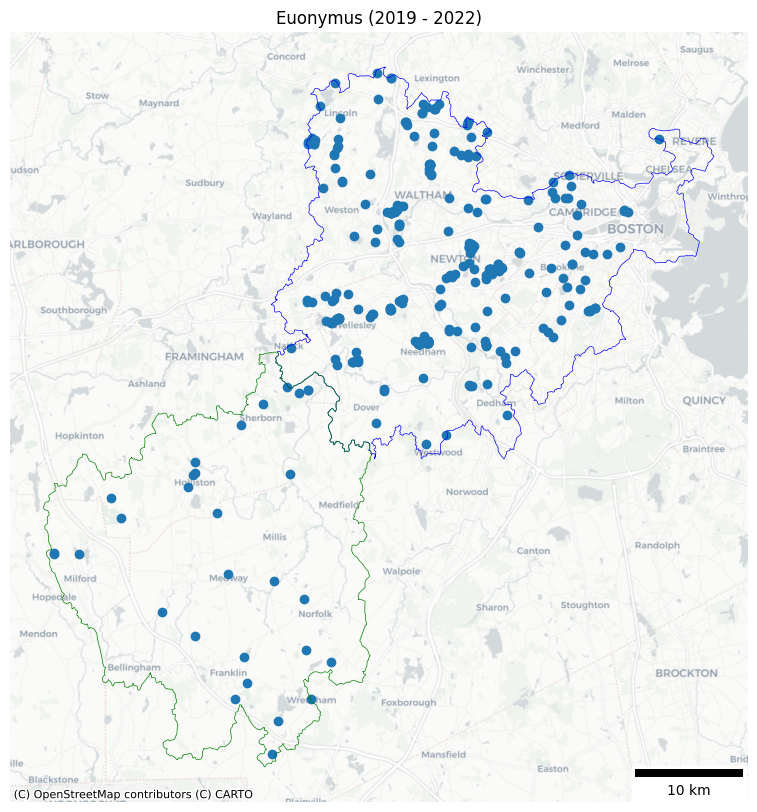

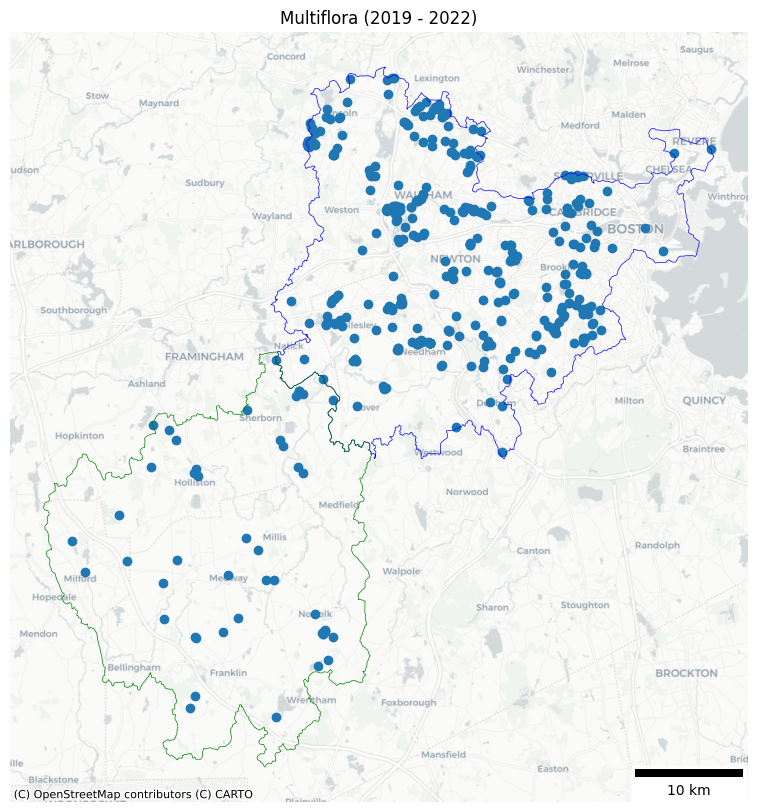

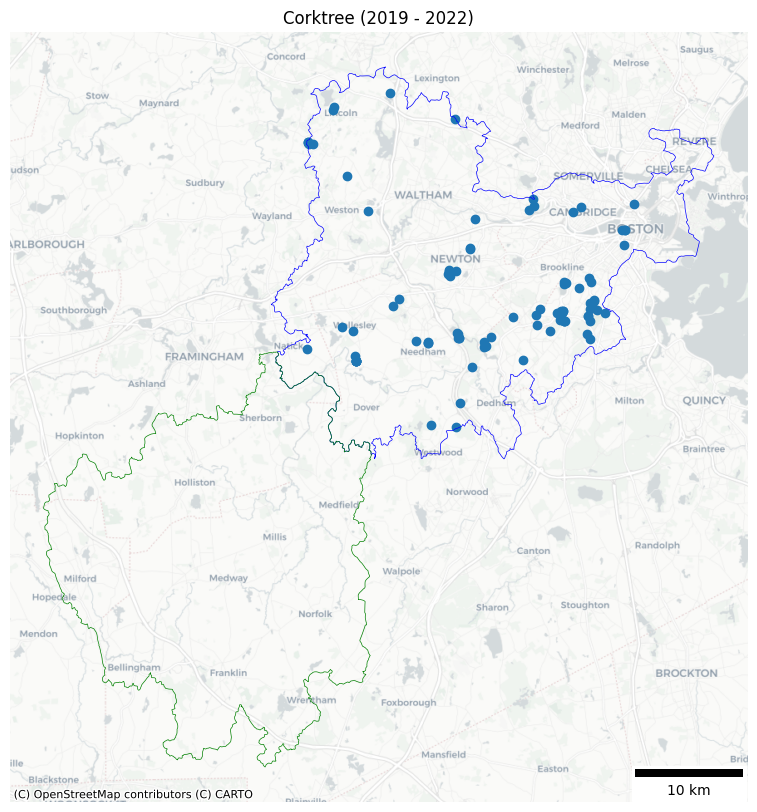

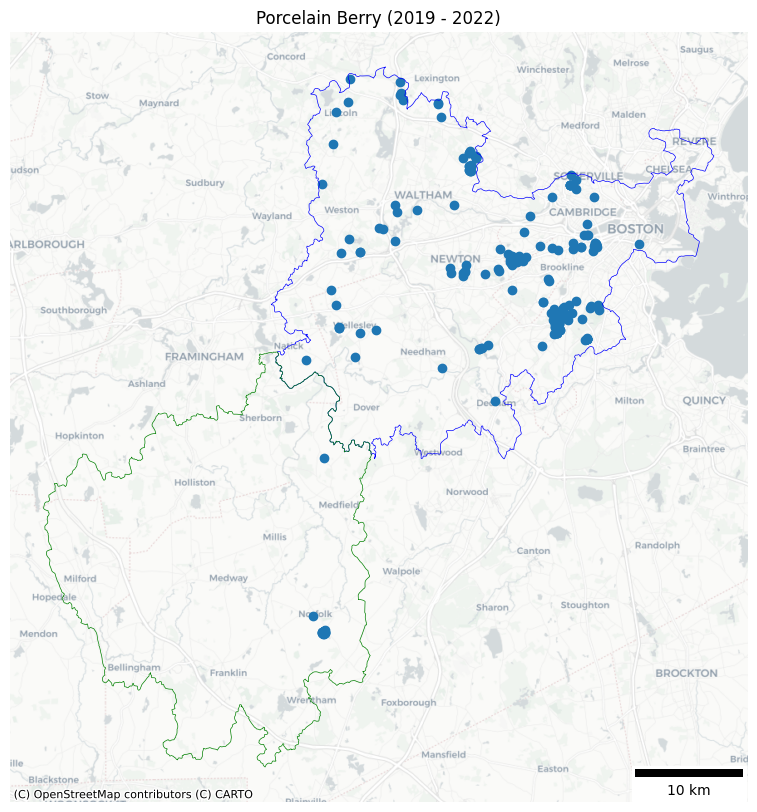

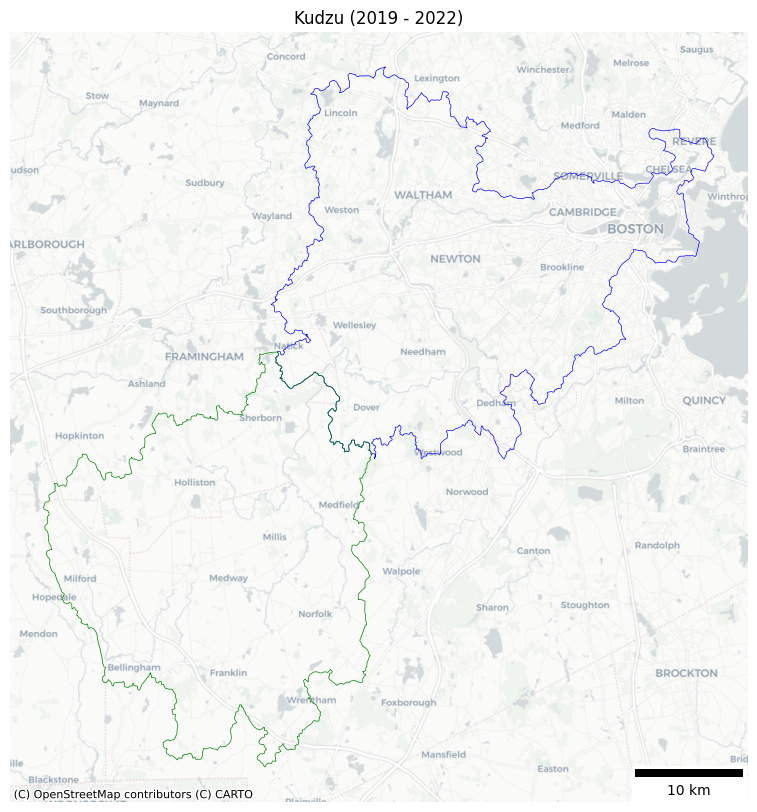

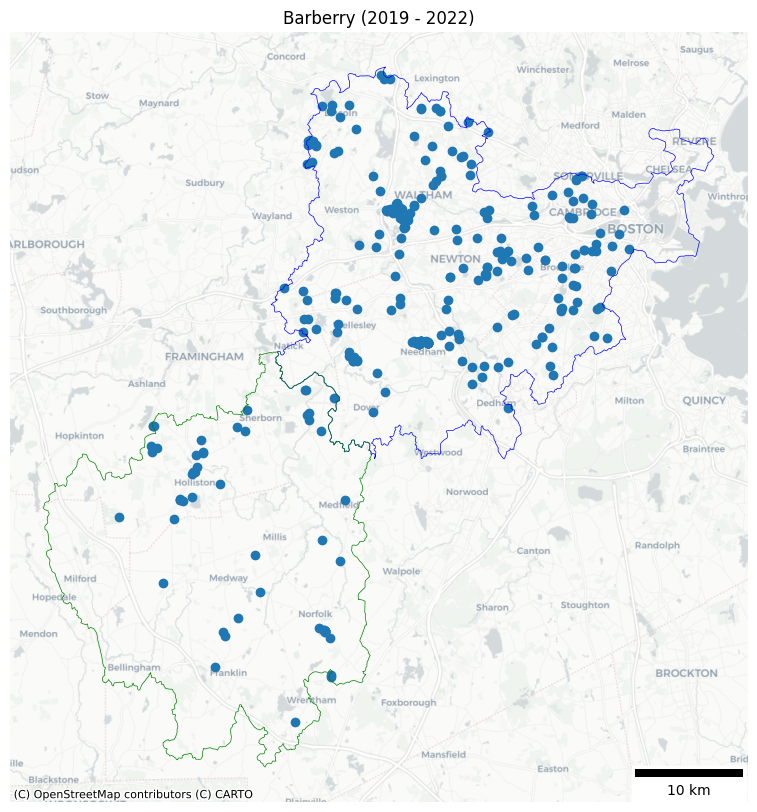

In [35]:
d={
  'Knotweed':knot_gdf,
  'Bittersweet':bitt_gdf,
  'Buckthorn':buck_gdf,
  'Euonymus':euon_gdf,
  'Multiflora':mult_gdf,
  'Corktree':cork_gdf,
  'Porcelain Berry':porc_gdf,
  'Kudzu':kudz_gdf,
  'Barberry':barb_gdf
}
for name, value in d.items():
  ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
  Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
  value.clip(Charles_gdf).to_crs(epsg=3857).plot(ax=ax)
  plt.title(name+" (2019 - 2022)")
  cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
  ax.set_axis_off()
  ax.add_artist(ScaleBar(1,location='lower right'))
  plt.savefig(name+'.png')

In [ ]:
#e_holm Survey 123   multiflora rose, knoteweed, buckthorn, Cutler Park, Gardens at Gethsemane, Harbor Islands, Habitat Belmont, forest and city network

<IPython.core.display.HTML object>

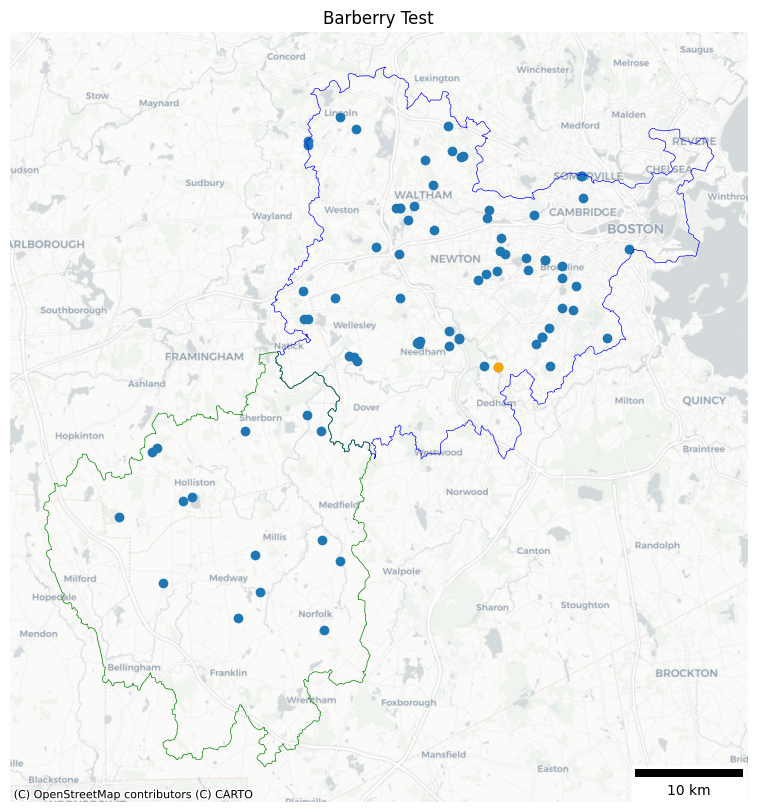

In [ ]:
ax = Charles_lower_gdf.to_crs(epsg=3857).boundary.plot(figsize=(10,10), color='blue',linewidth=0.5)
Charles_upper_gdf.to_crs(epsg=3857).boundary.plot(ax=ax,figsize=(10,10), color='green',linewidth=0.5)
barb_gdf.clip(Charles_gdf).to_crs(epsg=3857).plot(ax=ax)
barb_gdf.loc[[96],'geometry'].to_crs(epsg=3857).plot(ax=ax,color='orange')
plt.title('Barberry Test')
cx.add_basemap(ax,source=cx.providers.CartoDB.Positron)
ax.set_axis_off()
ax.add_artist(ScaleBar(1,location='lower right'))
plt.savefig('Barberry Test.png')

In [ ]:
def extractPixel(image):
  return image.sample(test_point)

<IPython.core.display.HTML object>

In [ ]:
coords=[barb_gdf.clip(Charles_gdf)['longitude'][96],barb_gdf.clip(Charles_gdf)['latitude'][96]]

<IPython.core.display.HTML object>

In [ ]:
test_point=ee.Geometry.Point(coords)

<IPython.core.display.HTML object>

In [ ]:
map_3 = geemapf.Map(center=[42.36565, -71.10832], zoom=9,tiles="cartodb positron")
map_3.add_layer(ee.Feature(d_forest_vec.first()))
map_3

<IPython.core.display.HTML object>

<geemap.foliumap.Map object at 0x7b0715e95cf0>

In [ ]:
#Pre-processing sentinel-2 data
S2_All=S2_fix.select(['NDVI','EVI','SAVI','RENDVI','NBR'])

<IPython.core.display.HTML object>

In [ ]:
S2_fix.first()

<IPython.core.display.HTML object>

<ee.image.Image object at 0x7e6ab3dc1ff0>

In [ ]:
S2_test=pd.DataFrame(data=S2_for_export.getRegion(XXX,10).getInfo()[1:],columns=S2_for_export.getRegion(XXX,10).getInfo()[0])

In [ ]:
S2_TEST=pd.DataFrame(data=S2_All.getRegion(test_point,10).getInfo()[1:],columns=S2_All.getRegion(test_point,10).getInfo()[0])
S2_TEST.iloc[0,3]=int(0)
S2_TEST=S2_TEST.merge(dates_df,left_index=True,right_index=True)


<IPython.core.display.HTML object>

TypeError: strptime() argument 1 must be str, not numpy.float64

In [ ]:
for i in np.arange(0,S2_forests.index.size-1):
  time_str1=S2_TEST.iloc[i+1,9]
  time_str2=S2_TEST.iloc[0,9]
  S2_TEST.iloc[i+1,3]=(datetime.strptime(time_str1,date_format)-datetime.strptime(time_str2,date_format)).days
S2_TEST.dropna()

<IPython.core.display.HTML object>

,id,longitude,latitude,time,NDVI,EVI,SAVI,RENDVI,NBR,date
0,0,-71.173924,42.27045,0,0.374958,0.201785,0.209989,0.209969,-0.409498,2019-01-03
1,1,-71.173924,42.27045,10,0.269841,0.164169,0.163890,0.207729,-0.338290,2019-01-13
5,5,-71.173924,42.27045,27,0.339120,0.210166,0.199489,0.063792,-0.403053,2019-01-30
8,8,-71.173924,42.27045,37,0.378734,0.218538,0.227839,0.163996,-0.316600,2019-02-09
9,9,-71.173924,42.27045,42,0.104719,0.184966,0.092501,0.054907,-0.590352,2019-02-14
...,...,...,...,...,...,...,...,...,...,...
252,252,-71.173924,42.27045,1050,0.335675,0.221729,0.223347,0.207591,-0.488398,2021-11-18
253,253,-71.173924,42.27045,1052,0.446142,0.327290,0.342321,0.208333,-0.537774,2021-11-20
256,256,-71.173924,42.27045,1062,0.464481,0.274459,0.294457,0.210205,-0.403141,2021-11-30
259,259,-71.173924,42.27045,1082,0.425273,0.245637,0.245011,0.212318,-0.381411,2021-12-20


<IPython.core.display.HTML object>

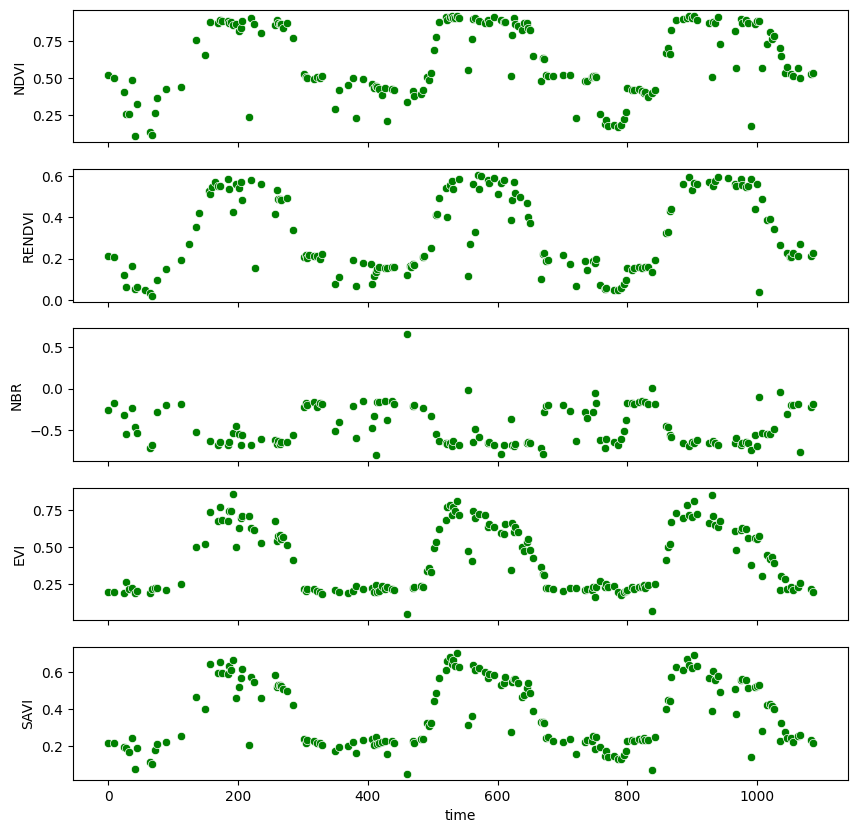

In [ ]:
figure, axes = plt.subplots(5, 1, sharex=True,figsize=(10, 10))
sns.scatterplot(data=S2_forests,x='time',y='NDVI',ax=axes[0],color='green')
sns.scatterplot(data=S2_forests,x='time',y='RENDVI',ax=axes[1],color='green')
sns.scatterplot(data=S2_forests,x='time',y='NBR',ax=axes[2],color='green')
sns.scatterplot(data=S2_forests,x='time',y='EVI',ax=axes[3],color='green')
sns.scatterplot(data=S2_forests,x='time',y='SAVI',ax=axes[4],color='green')
plt.savefig('Test indices data.png')

<IPython.core.display.HTML object>

<Axes: xlabel='time', ylabel='SAVI'>

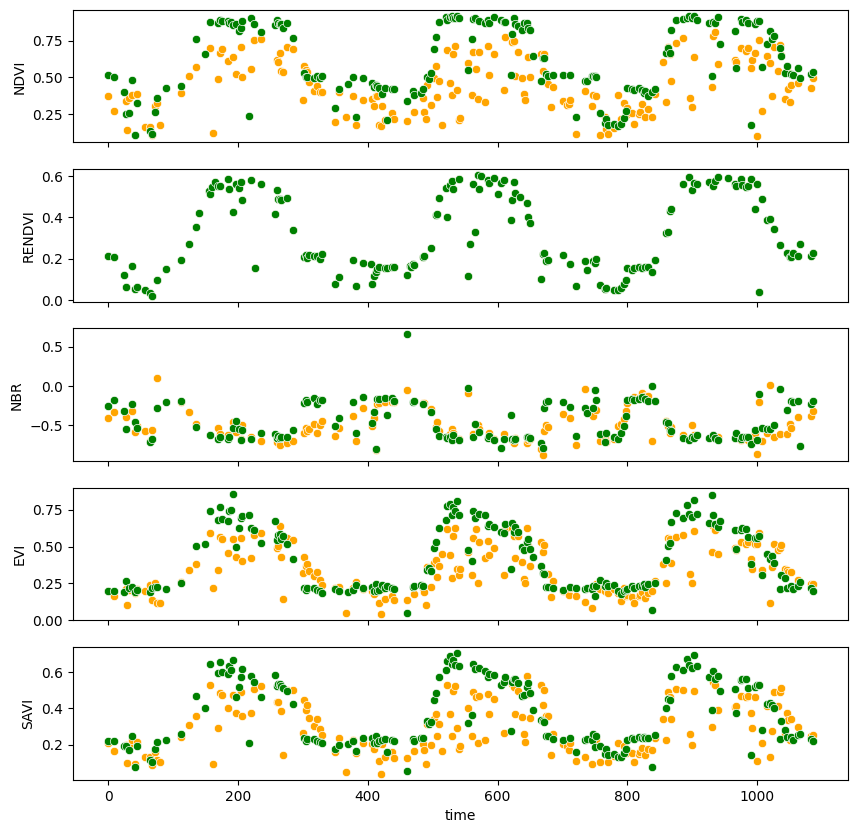

In [ ]:
figure, axes = plt.subplots(5, 1, sharex=True,figsize=(10, 10))
sns.scatterplot(data=S2_TEST,x='time',y='NDVI',ax=axes[0],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='RENDVI',ax=axes[1],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='NBR',ax=axes[2],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='EVI',ax=axes[3],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='SAVI',ax=axes[4],color='orange')
sns.scatterplot(data=S2_forests,x='time',y='NDVI',ax=axes[0],color='green')
sns.scatterplot(data=S2_forests,x='time',y='RENDVI',ax=axes[1],color='green')
sns.scatterplot(data=S2_forests,x='time',y='NBR',ax=axes[2],color='green')
sns.scatterplot(data=S2_forests,x='time',y='EVI',ax=axes[3],color='green')
sns.scatterplot(data=S2_forests,x='time',y='SAVI',ax=axes[4],color='green')

<IPython.core.display.HTML object>

<Axes: xlabel='time', ylabel='SAVI'>

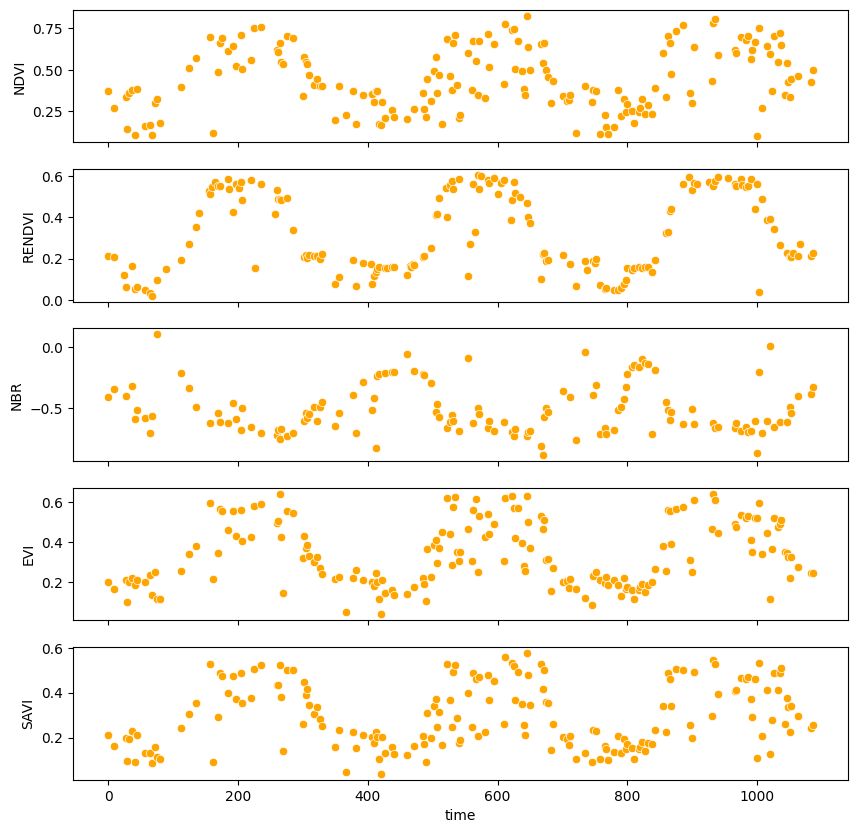

In [ ]:
figure, axes = plt.subplots(5, 1, sharex=True,figsize=(10, 10))
sns.scatterplot(data=S2_TEST,x='time',y='NDVI',ax=axes[0],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='RENDVI',ax=axes[1],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='NBR',ax=axes[2],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='EVI',ax=axes[3],color='orange')
sns.scatterplot(data=S2_TEST,x='time',y='SAVI',ax=axes[4],color='orange')

In [ ]:
# Why do I get an error for some of the gifs I'm trying to generate but not others?
# How to extract pixel values from image collection so I can make time series graphs?
# How to get data stacked from my image collection into a matrix so I can run machine learning?



#Upsample if I want to make GIF